









Heading to  [  0.         -15.          -2.          -1.57079633] , from  [  0. -15.  -2.]
Heading to  [  0.09090909 -15.09090909  -2.          -1.5549297 ] , from  [  0. -15.  -2.]
Heading to  [  0.18181818 -15.18181818  -2.          -1.53906307] , from  [  0.09589143 -15.0975943   -2.00539118]
Heading to  [  0.27272727 -15.27272727  -2.          -1.52319644] , from  [  0.18592372 -15.17886292  -2.00001194]
Heading to  [  0.36363636 -15.36363636  -2.          -1.50732981] , from  [  0.27898865 -15.28020538  -1.9988645 ]
Heading to  [  0.45454545 -15.45454545  -2.          -1.49146318] , from  [  0.37286881 -15.36662123  -2.00189428]
Heading to  [  0.54545455 -15.54545455  -2.          -1.47559655] , from  [  0.45116947 -15.45505009  -2.00189941]
Heading to  [  0.63636364 -15.63636364  -2.          -1.45972992] , from  [  0.55205312 -15.55137211  -1.9967684 ]
Heading to  [  0.72727273 -15.72727273  -2.          -1.44386329] , from  [  0.64031874 -15.63913646  -2.00362785]
Hea

Heading to  [  6.54545455 -21.54545455  -2.          -0.428399  ] , from  [  6.4504027  -21.45407198  -1.99546748]
Heading to  [  6.63636364 -21.63636364  -2.          -0.41253237] , from  [  6.54989313 -21.55383682  -1.99747926]
Heading to  [  6.72727273 -21.72727273  -2.          -0.39666574] , from  [  6.64340918 -21.64153404  -1.9955522 ]
Heading to  [  6.81818182 -21.81818182  -2.          -0.38079911] , from  [  6.72984703 -21.73516304  -1.99451111]
Heading to  [  6.90909091 -21.90909091  -2.          -0.36493248] , from  [  6.82647372 -21.81609561  -1.99594309]
Heading to  [  7.         -22.          -2.          -0.34906585] , from  [  6.91454548 -21.91693194  -2.00176078]
Heading to  [  7.09090909 -22.09090909  -2.          -0.33319922] , from  [  6.99988621 -21.9993775   -2.0011752 ]
Heading to  [  7.18181818 -22.18181818  -2.          -0.31733259] , from  [  7.09773105 -22.08920857  -2.00139138]
Heading to  [  7.27272727 -22.27272727  -2.          -0.30146596] , from  [  7.1

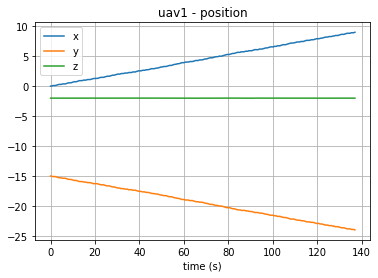

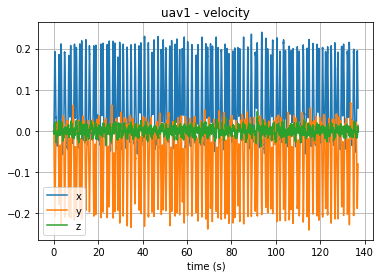

In [16]:
#!/usr/bin/env python
# coding: utf-8
%matplotlib inline
%reload_ext autoreload
%autoreload 2
import sys
import numpy as np
from IPython.display import HTML, display

sys.path.insert(0, '../')
from flightgoggles.env import *

if __name__ == "__main__":
    env = flightgoggles_env(
        cfg_dir="../config",
        cfg_fgclient="FlightGogglesClient_testing.yaml",
        cfg_uav="multicopterDynamicsSimSpeed.yaml")

    start_pos = np.array([0, -15., -2.])
    env.set_state_vehicle(vehicle_id="uav1", 
                          position = start_pos,
                          attitude_euler_angle=np.array([0.,0.,-np.pi/2]))
    curr_pos = env.get_state("uav1")["position"]
    curr_att = env.get_state("uav1")["attitude_euler_angle"]
    curr_vel = env.get_state("uav1")["velocity"]
    
    target_pose = np.zeros(4)
    target_pose[:3] = curr_pos + np.array([9.0,-9.0,0.0])
    target_pose[3] = curr_att[2] + np.pi/2
    
    att_accumulator = np.array([curr_att[2]])
    
    
    x_vals = np.linspace(start_pos[0], target_pose[0], num=100)
    y_vals = np.linspace(start_pos[1], target_pose[1], num=100)
    z_vals = np.linspace(start_pos[2], target_pose[2], num=100)
    att_vals = np.linspace(curr_att[2], target_pose[3], num=100)
    
    path_coords = np.vstack((x_vals, y_vals, z_vals, att_vals))
    
    stop = False
    for column in path_coords.T:
        print("Heading to ", column, ", from ", curr_pos)
        while np.linalg.norm(curr_pos - column[:3]) > 0.01 or np.sum(curr_vel**2) > 0.01:
            collided = env.speed_waypoint(vehicle_id="uav1",
                                          waypoint_command=column,
                                          duration=0.01)
            curr_pos = env.get_state("uav1")["position"]
            curr_vel = env.get_state("uav1")["velocity"]
            att_accumulator = np.append(att_accumulator, env.get_state("uav1")["attitude_euler_angle"][2])
            if collided:
                stop = True
                break
        if stop:
            break
    
    print(target_pose)
    print(env.get_state("uav1")["position"])
    print(env.get_state("uav1")["attitude_euler_angle"][2])
    
    env.plot_state(vehicle_id="uav1", attribute="position")
    env.plot_state(vehicle_id="uav1", attribute="velocity")

    ani_set = env.plot_state_video(flag_save=False, filename="uav", dpi=400)
    if "cam1" in ani_set.keys():
        display(HTML(ani_set["cam1"].to_html5_video()))
    env.close()

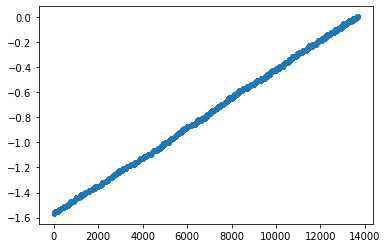

In [18]:
import matplotlib.pyplot as plt

x = np.arange(att_accumulator.size)
y = att_accumulator
plt.plot(x, y, marker='.')